In [1]:
# hide pakcage non critical warnings

import warnings

warnings.filterwarnings('ignore')

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))


%load_ext autoreload
%autoreload 2

%matplotlib inline

In [2]:
import matplotlib.pyplot as plt

import scipy.io as sio

import torch
import torch.nn as nn

import torch.nn.functional as F
import torch.nn.init as init

from tensorboard_logger import Logger

import os
import sys
import random
import pickle
import numpy as np
import pandas as pd


In [3]:
import devkit.api as dk

In [4]:
sys.path.append(
    os.path.abspath(
        os.path.join(os.path.dirname('__file__'), "..", '..', 'src')
    ))

In [5]:
import config as cfg

In [6]:
data_name = 'cic'

In [7]:
datadir = cfg.get_data_dir(data_name)
version = "mknn_k100_euclidean"
outputdir = cfg.get_output_dir(data_name, version)

In [8]:
datadir

'/home/egxxlch/dev/dccapp/data/raw/cic'

In [9]:
outputdir

'/home/egxxlch/dev/dccapp/data/raw/cic/mknn_k100_euclidean/results'

In [10]:
traindata = sio.loadmat(os.path.join(datadir, "traindata.mat"))

In [11]:
traindata

{'__header__': b'MATLAB 5.0 MAT-file Platform: posix, Created on: Thu Aug 27 01:57:13 2020',
 '__version__': '1.0',
 '__globals__': [],
 'X': array([[9.47238784e-03, 9.47238784e-03, 1.42085822e-02, ...,
         1.48644550e-02, 4.69374806e-02, 3.72162946e-02],
        [4.07312691e-01, 4.02576476e-01, 3.97840291e-01, ...,
         2.25462615e-01, 2.22939253e-01, 2.10984260e-01],
        [2.72720844e-01, 2.76262671e-01, 2.79804498e-01, ...,
         9.75370824e-01, 1.00000000e+00, 1.00000000e+00],
        ...,
        [2.07210947e-02, 2.30234377e-02, 2.76281256e-02, ...,
         4.17910442e-02, 2.03980096e-02, 4.47761174e-03],
        [1.77091453e-02, 1.77091453e-02, 1.41673163e-02, ...,
         1.36072934e-03, 4.08218795e-04, 9.52510571e-04],
        [2.26677060e-01, 2.40844369e-01, 2.37302542e-01, ...,
         2.51734927e-02, 2.76228059e-02, 2.84392443e-02]]),
 'gtlabels': array([[array(['access_cell_edge'], dtype='<U16'),
         array(['prach_interference'], dtype='<U18'),
      

In [12]:
pretrained = sio.loadmat(os.path.join(datadir, version, "pretrained.mat"))

In [13]:
pretrained

{'__header__': b'MATLAB 5.0 MAT-file Platform: posix, Created on: Thu Aug 27 07:02:23 2020',
 '__version__': '1.0',
 '__globals__': [],
 'X': array([[9.4723878e-03, 9.4723878e-03, 1.4208582e-02, ..., 1.4864455e-02,
         4.6937481e-02, 3.7216295e-02],
        [4.0731269e-01, 4.0257648e-01, 3.9784029e-01, ..., 2.2546262e-01,
         2.2293925e-01, 2.1098426e-01],
        [2.7272084e-01, 2.7626267e-01, 2.7980450e-01, ..., 9.7537082e-01,
         1.0000000e+00, 1.0000000e+00],
        ...,
        [2.0721095e-02, 2.3023438e-02, 2.7628126e-02, ..., 4.1791044e-02,
         2.0398010e-02, 4.4776117e-03],
        [1.7709145e-02, 1.7709145e-02, 1.4167316e-02, ..., 1.3607293e-03,
         4.0821880e-04, 9.5251057e-04],
        [2.2667706e-01, 2.4084437e-01, 2.3730254e-01, ..., 2.5173493e-02,
         2.7622806e-02, 2.8439244e-02]], dtype=float32),
 'Z': array([[ 4.9274787e-01, -4.3364081e+00, -4.2329493e+00, ...,
         -1.8238617e+00, -4.0307651e+00, -1.9671562e+00],
        [ 8.2698762e

In [14]:
traindata['X'].shape

(9698, 768)

In [15]:
with open(os.path.join(datadir, version, "pretrained.pkl"), 'rb') as f:
    pretrain_info = pickle.load(f)

In [16]:
pretrain_info.keys()

dict_keys(['Z', 'data'])

In [17]:
print(pretrain_info['data'].shape, pretrain_info['Z'].shape)

(9698, 768) (9698, 10)


In [18]:
y_gt = [traindata['gtlabels'].flatten()[i][0] for i in range(len(traindata['gtlabels'].flatten()))]

y_gt = np.asarray(y_gt)

In [19]:
y_gt.shape

(9698,)

In [20]:
dict_label2int = dict(zip(np.unique(y_gt), range(len(np.unique(y_gt)))))

In [21]:
dict_label2int

{'access_cell_edge': 0,
 'access_resource': 1,
 'high_load': 2,
 'ho_SR': 3,
 'no_issue': 4,
 'normal': 5,
 'prach_interference': 6,
 'resource_limit': 7,
 'signaling_SR': 8,
 'signaling_load': 9,
 'uplink_interf': 10,
 'very_high_load': 11}

In [22]:
pd.Series(y_gt).value_counts()

access_cell_edge      930
ho_SR                 923
no_issue              913
normal                899
high_load             880
uplink_interf         876
prach_interference    868
resource_limit        859
signaling_SR          859
signaling_load        852
access_resource       747
very_high_load         92
dtype: int64

In [23]:
y_gt_int = np.array([dict_label2int[i] for i in y_gt])

In [24]:
y_gt_int.shape

(9698,)

In [25]:
X = pretrain_info['data']
X.shape

(9698, 768)

In [26]:
Z = pretrain_info['Z']
Z.shape

(9698, 10)

In [27]:
Z

array([[ 4.9274787e-01, -4.3364081e+00, -4.2329493e+00, ...,
        -1.8238617e+00, -4.0307651e+00, -1.9671562e+00],
       [ 8.2698762e-02, -4.1219002e-01,  3.0317039e+00, ...,
        -1.9495842e+00, -1.4999166e+00, -2.0465896e+00],
       [ 4.3710084e+00, -1.2257947e+00,  7.0983815e-01, ...,
        -6.1013212e+00, -4.1242428e+00,  2.8908753e+00],
       ...,
       [-1.7120743e+00, -3.5220165e+00, -4.2494192e+00, ...,
        -4.6139522e+00, -3.9815750e+00, -1.6631873e+00],
       [ 1.5214318e+00, -4.7237196e+00,  1.2697761e+00, ...,
        -1.3002689e+00,  2.8812587e-03, -5.2460504e-01],
       [-2.0555331e-01, -2.3615680e+00,  1.4042417e+00, ...,
        -1.9321899e-01, -5.0561637e-01, -1.1548315e-01]], dtype=float32)

In [28]:
n_samples = 10000
if len(Z) < 10000:
    n_samples = len(Z)
ixs_selected = np.random.choice(len(Z),n_samples, replace=False)

In [29]:
n_samples

9698

# viz raw data [X]

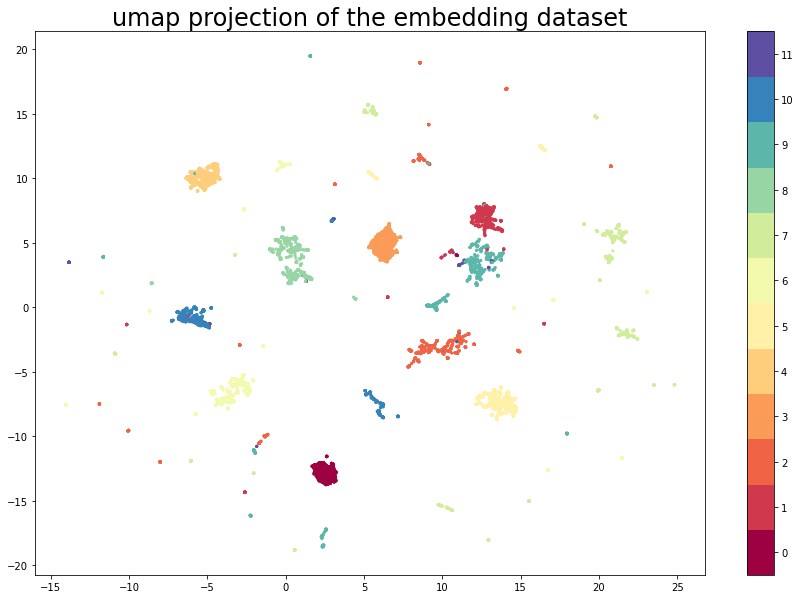

In [68]:
dk.data_viz(X=X[ixs_selected], y=y_gt_int[ixs_selected], method='umap')

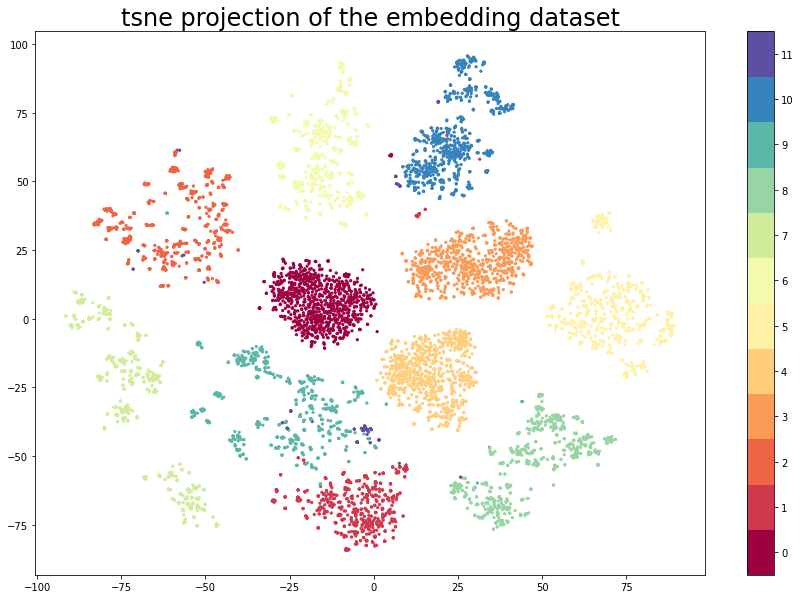

In [69]:
dk.data_viz(X=X[ixs_selected], y=y_gt_int[ixs_selected], method='tsne')

# viz embedding of sdae [Z]

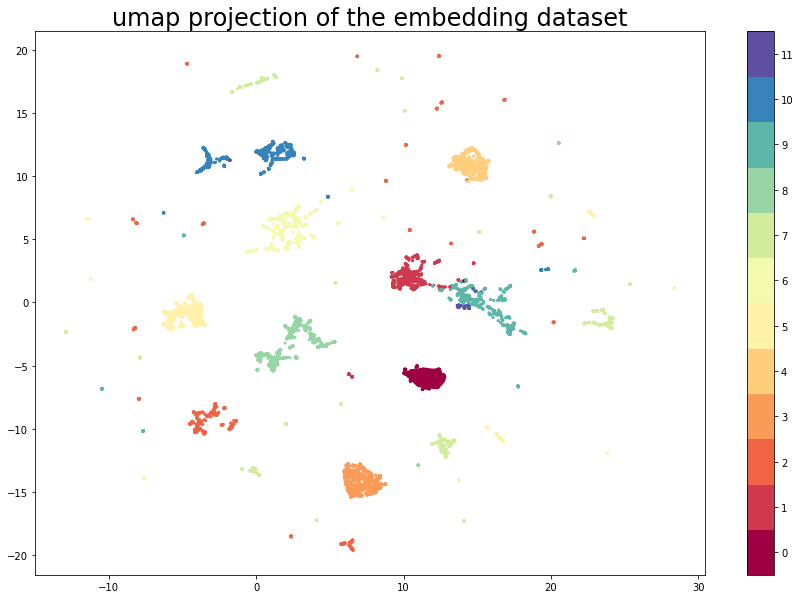

In [70]:
dk.data_viz(X=Z[ixs_selected], y=y_gt_int[ixs_selected], method='umap')

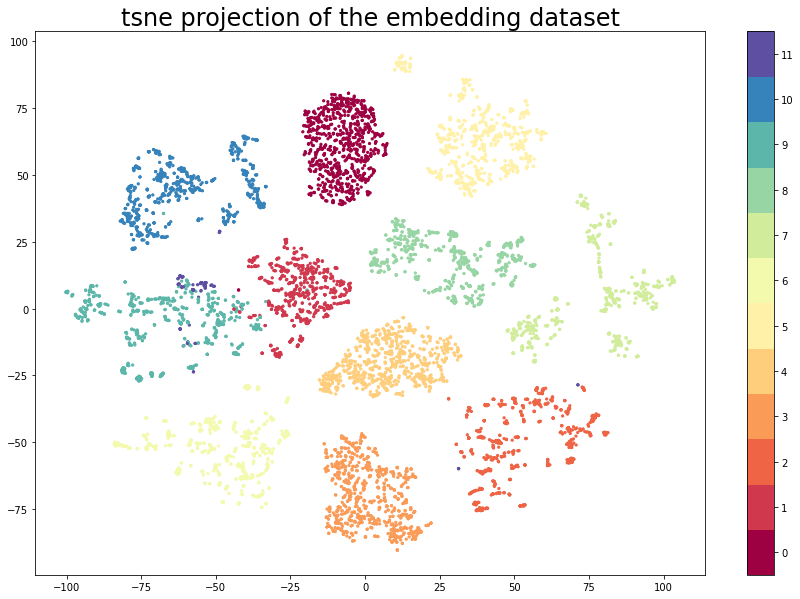

In [71]:
dk.data_viz(X=Z[ixs_selected], y=y_gt_int[ixs_selected], method='tsne')

# viz embedding of dcc [U]

## calculate U from checkpoint

In [30]:
from DCCLoss import DCCWeightedELoss, DCCLoss
from DCCComputation import computeHyperParams, computeObj

In [31]:
pairs = pretrained['w'][:, :3].astype(int)

In [32]:
pairs.shape

(241675, 3)

In [33]:
_sigma1, _sigma2, _lambda, _delta, _delta1, _delta2, lmdb, lmdb_data = computeHyperParams(pairs, Z)

The endpoints are Delta1: 51.468, Delta2: 0.119


In [34]:
datadir

'/home/egxxlch/dev/dccapp/data/raw/cic'

In [35]:
version

'mknn_k100_euclidean'

In [36]:
dcc_ckp = torch.load(os.path.join(datadir, version, "results/FTcheckpoint_120.pth.tar"))

In [37]:
dcc_ckp.keys()

dict_keys(['epoch', 'state_dict', 'criterion_state_dict', 'optimizer', 'sigma1', 'sigma2', 'lambda', 'delta', 'delta1', 'delta2'])

In [38]:
Z.shape

(9698, 10)

In [39]:
criterion2 = DCCLoss(Z.shape[0], Z.shape[1], Z, size_average=True)

In [40]:
criterion2.load_state_dict(dcc_ckp['criterion_state_dict'])

<All keys matched successfully>

In [41]:
U = criterion2.U.data.cpu().numpy()

In [42]:
index, n_components, y_pred = computeObj(U, pairs, _delta, len(U))

In [43]:
n_components

26

In [53]:
len(y_pred)

9698

In [54]:
U.shape

(9698, 10)

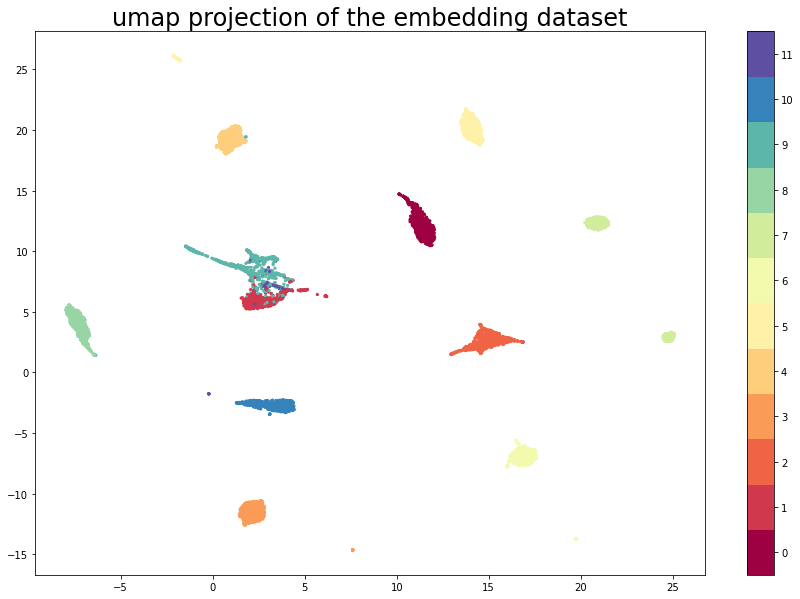

In [55]:
dk.data_viz(X=U[ixs_selected], y=y_gt_int[ixs_selected], method='umap')

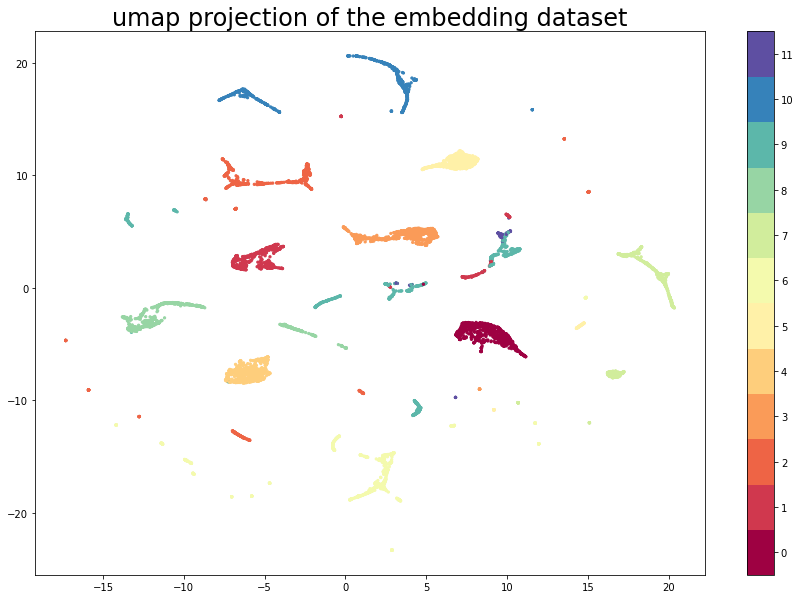

In [84]:
dk.data_viz(X=U[ixs_selected], y=y_gt_int[ixs_selected], method='umap')

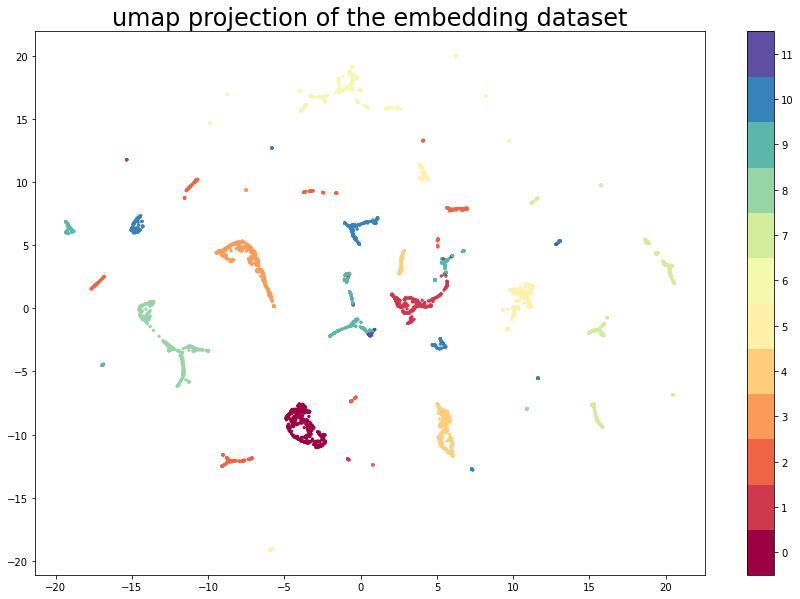

In [63]:
dk.data_viz(X=U[ixs_selected], y=y_gt_int[ixs_selected], method='umap')

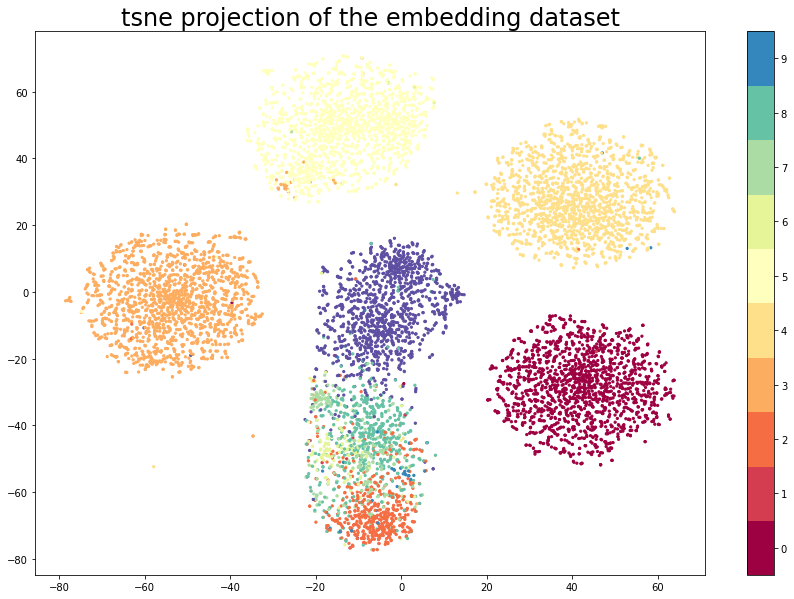

In [147]:
dk.data_viz(X=U[ixs_selected], y=y_gt_int[ixs_selected], method='tsne')

## get the U from final output

In [62]:
datadir

'/home/egxxlch/dev/capacity_ai/proof-of-concept/data/raw/cic_v1'

In [63]:
dcc_res = sio.loadmat(os.path.join(datadir, "results/features.mat"))

In [64]:
dcc_res.keys()

dict_keys(['__header__', '__version__', '__globals__', 'Z', 'U', 'w', 'cluster'])

In [65]:
U_final = dcc_res['U']

In [66]:
y_gt = dcc_res['gtlabels'].flatten()

KeyError: 'gtlabels'

In [37]:
y_pred = dcc_res['cluster'].flatten()

In [38]:
y_pred.shape

(28302,)

In [28]:
assert (y_gt == y_gt_pretrain).all()

In [167]:
print(U_final.shape, y_gt.shape)

(28302, 10) (28302,)


## viz U

### umap

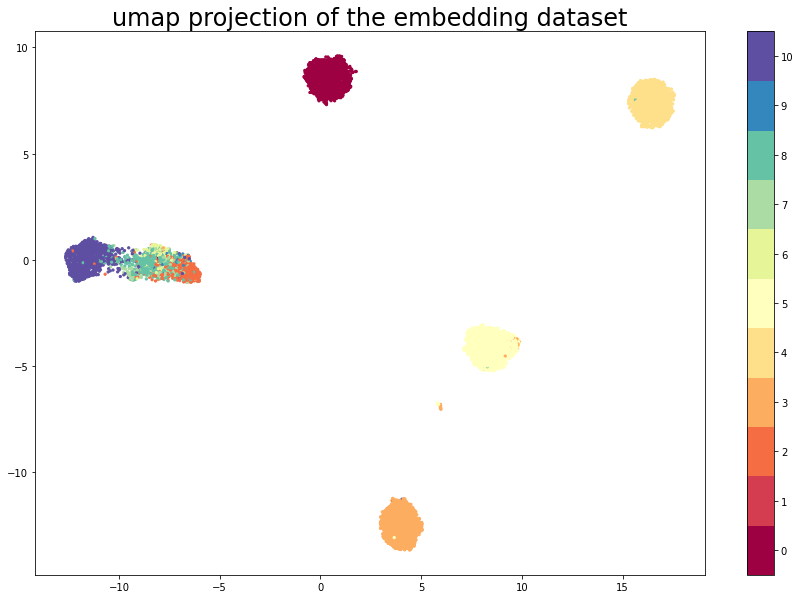

In [67]:
dk.data_viz(X=U_final[ixs_selected], y=y_gt_int[ixs_selected], method='umap')

### tsne

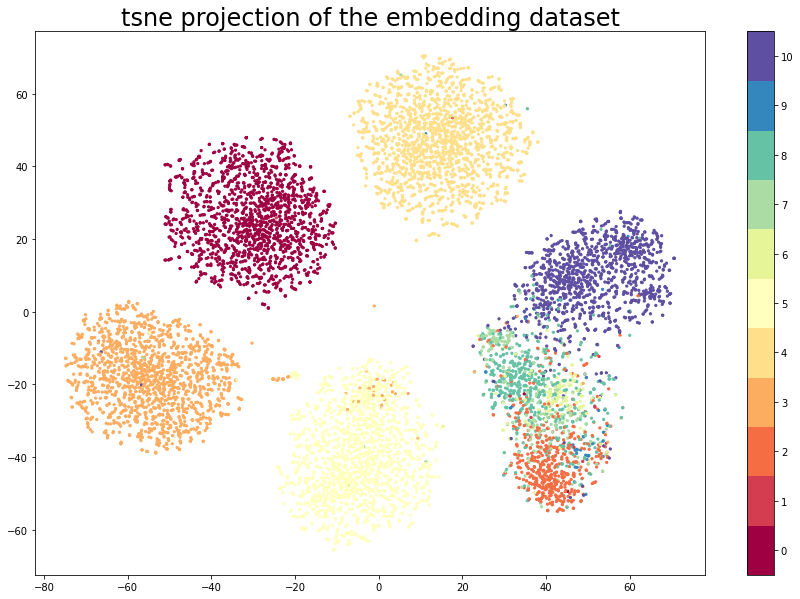

In [69]:
dk.data_viz(X=U_final[ixs_selected], y=y_gt_int[ixs_selected], method='tsne')

# viz images by cluster

In [59]:
import pandas as pd

In [60]:
vc_by_ygt = pd.Series(y_gt).value_counts()

In [61]:
vc_by_ygt

access_cell_edge      930
ho_SR                 923
no_issue              913
normal                899
high_load             880
uplink_interf         876
prach_interference    868
resource_limit        859
signaling_SR          859
signaling_load        852
access_resource       747
very_high_load         92
dtype: int64

In [62]:
pd.Series(y_pred).value_counts()

5     1653
6      923
0      920
10     913
7      899
4      879
3      876
1      857
2      857
9      581
8      278
11      18
15      11
14       8
23       5
20       4
22       3
19       2
18       2
13       2
16       2
12       1
25       1
17       1
21       1
24       1
dtype: int64

In [66]:
lst_top_classes = pd.Series(y_pred).value_counts().index.tolist()[:10]
lst_bottom_classes = pd.Series(y_pred).value_counts().index.tolist()[-20:]

lst_ix_selected = [i for i,v in enumerate(y_pred) if v in lst_top_classes]

len(lst_ix_selected)

9358

In [67]:
X_2d = X.reshape(-1, 24, 32)

In [63]:
import devkit.api as dk

In [64]:
lst_top_classes

[5, 6, 0, 10, 7, 4, 3, 1, 2, 9]

total samples: 36 / 1653


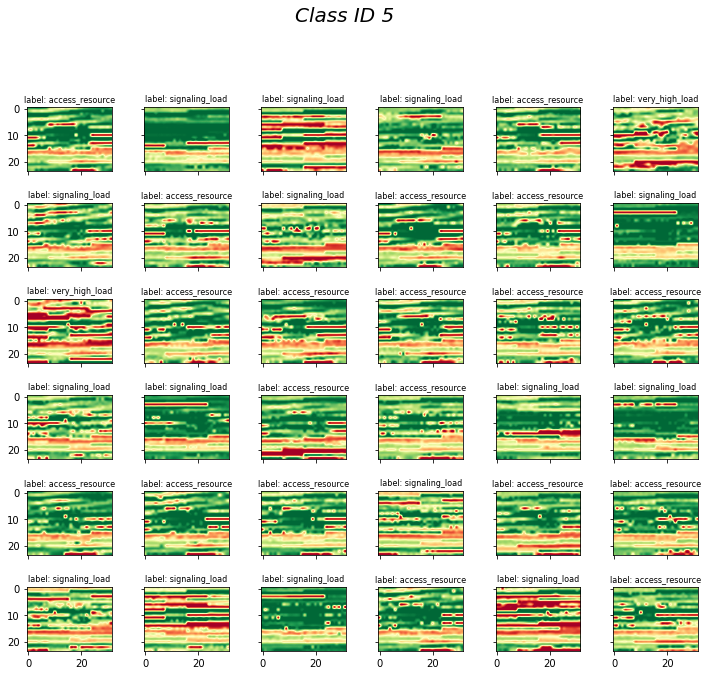

total samples: 36 / 923


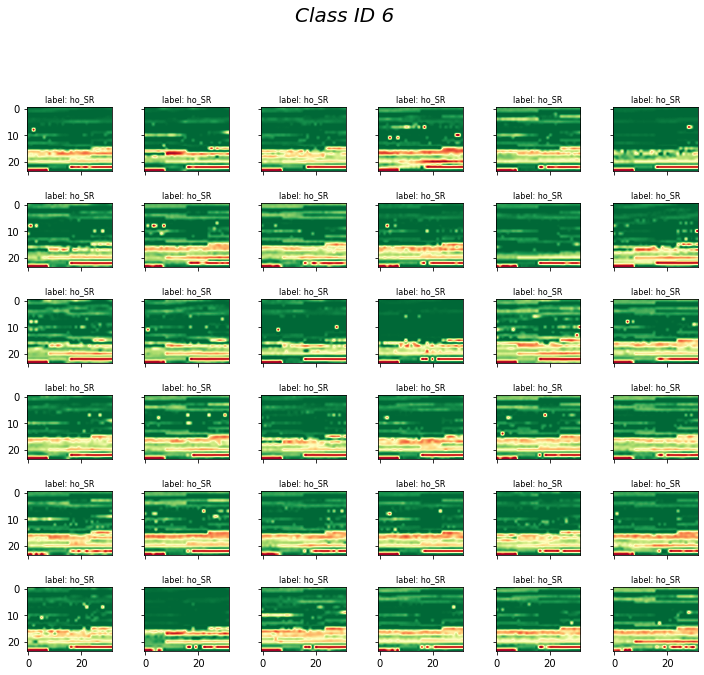

total samples: 36 / 920


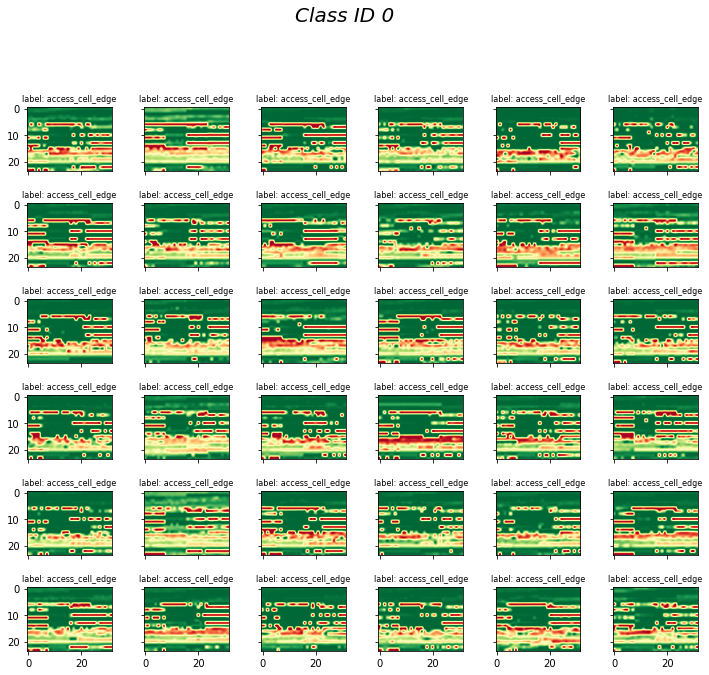

total samples: 36 / 913


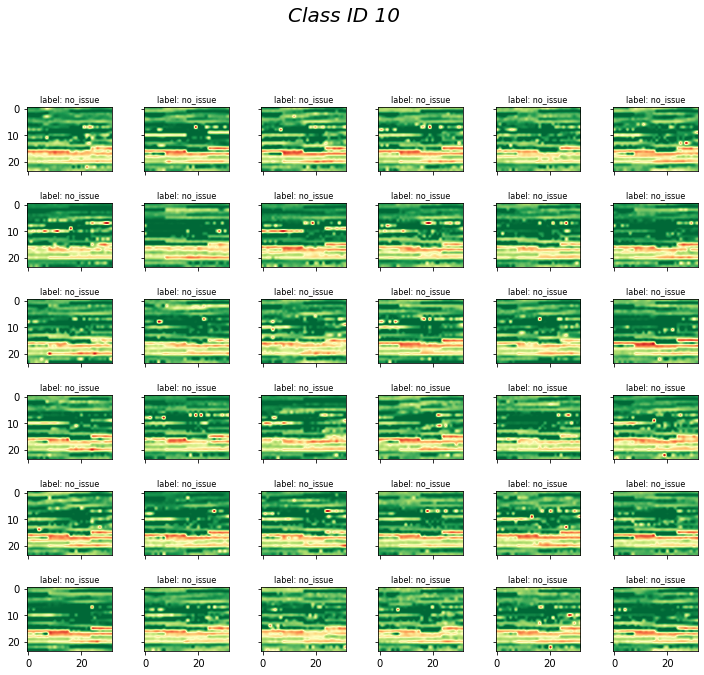

total samples: 36 / 899


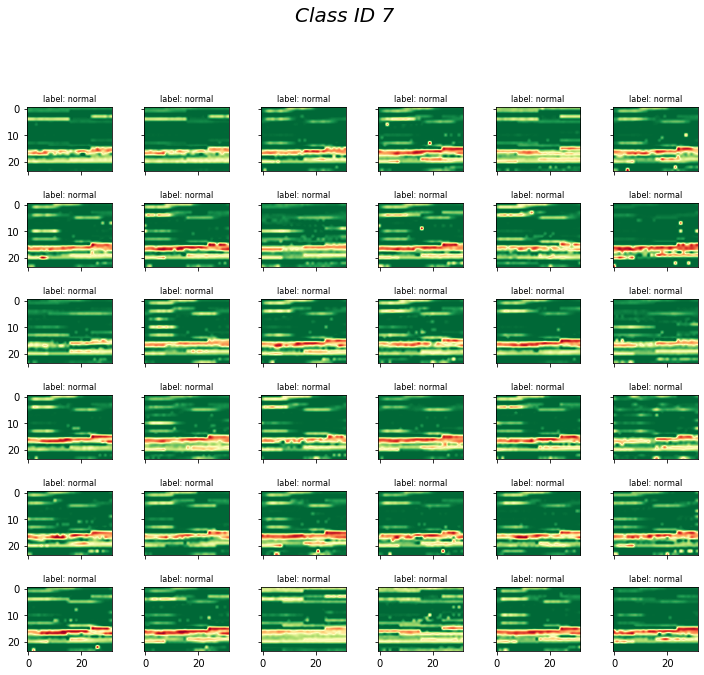

total samples: 36 / 879


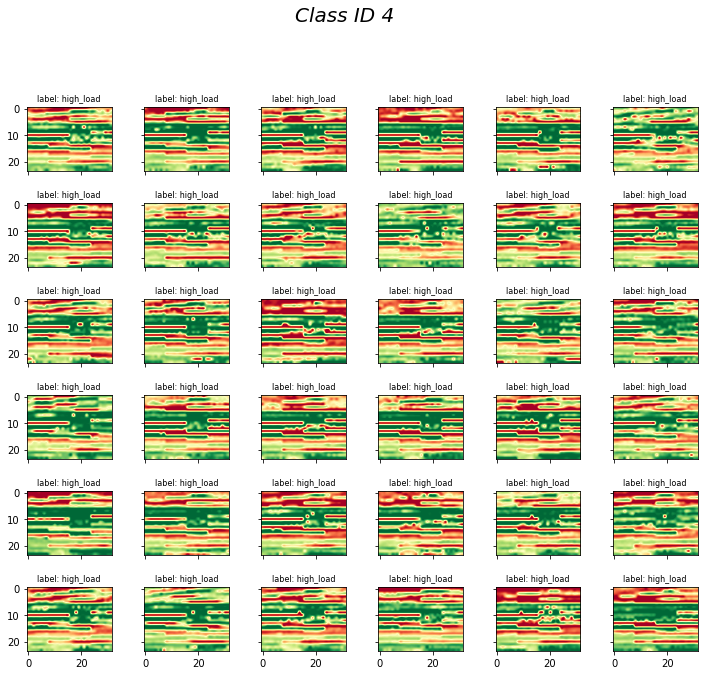

total samples: 36 / 876


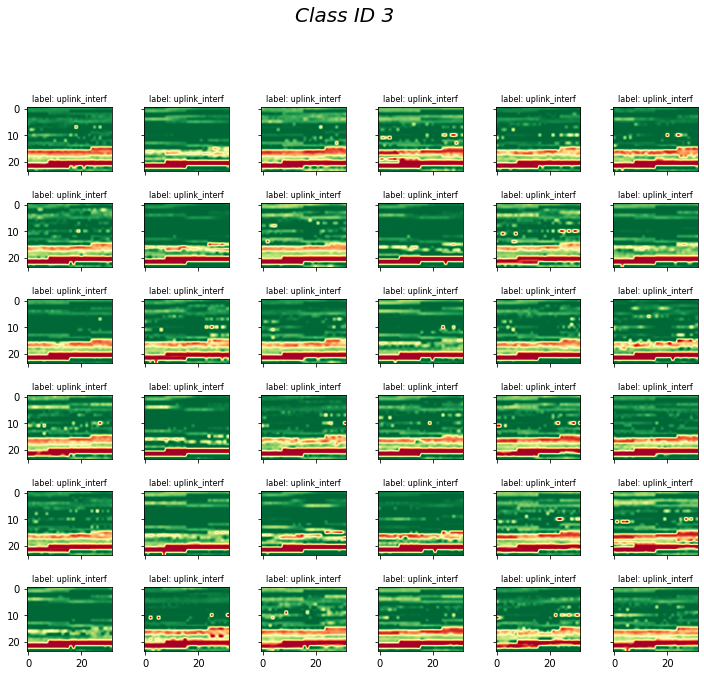

total samples: 36 / 857


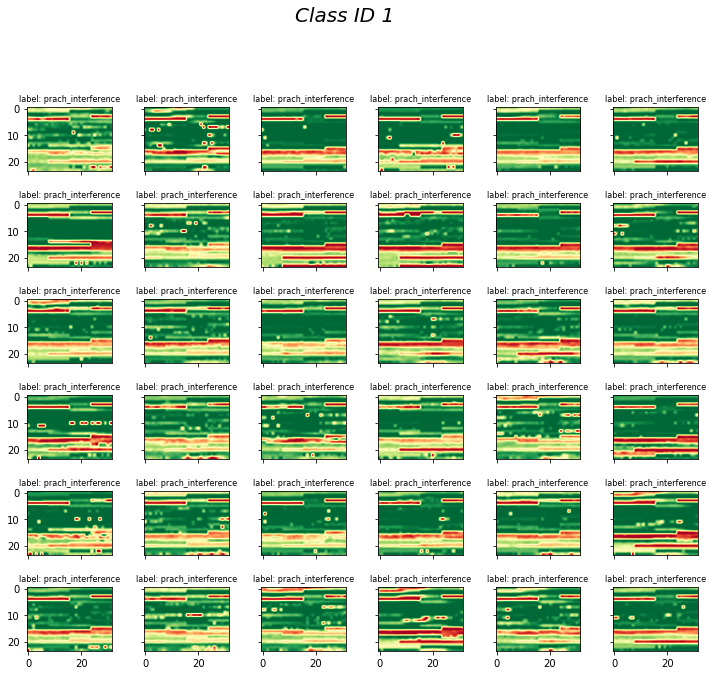

total samples: 36 / 857


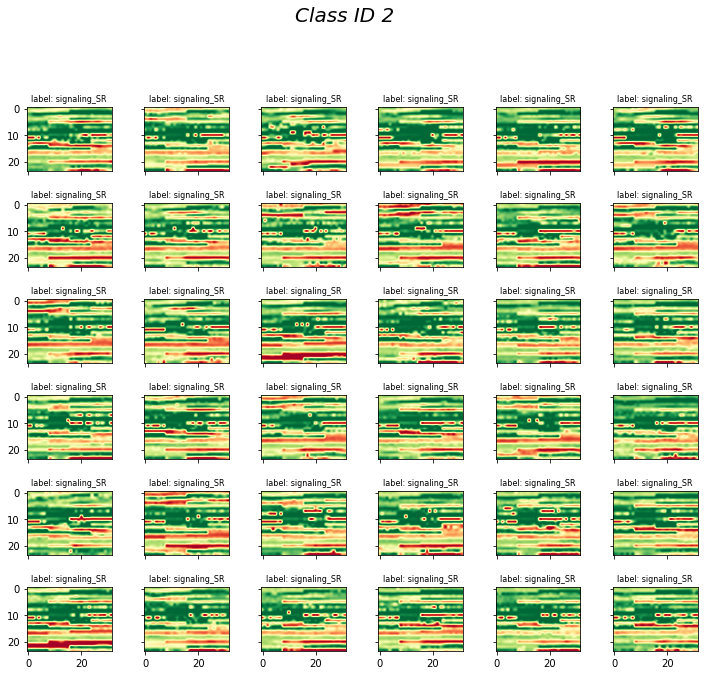

total samples: 36 / 581


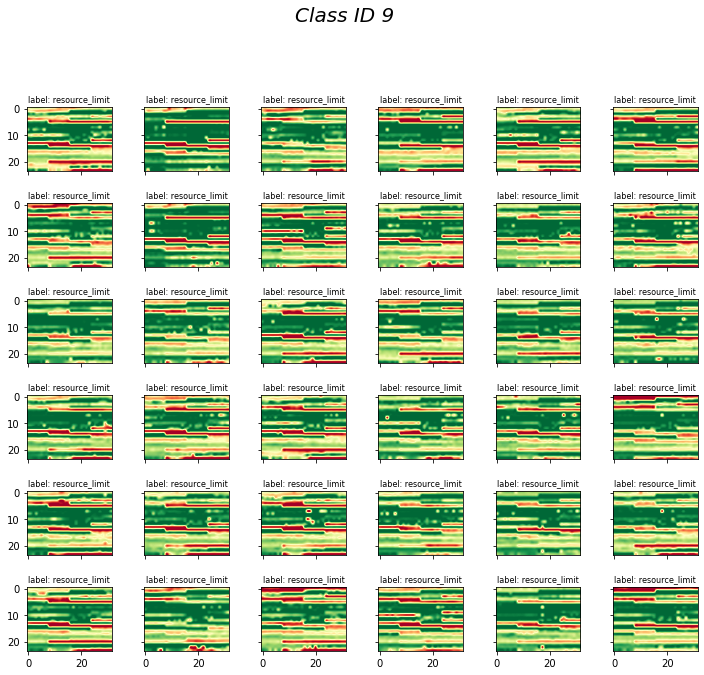

In [65]:
nrows = 10
ncols = 4
figsize = (ncols*10, nrows*3)

# default parameter values
def_vals = {'X' : None, 
            'arr_mse': None, 
            'arr_labels': None,
            'category': 'my_class', 
            'set_random': True,
            'figsize': figsize,
            'title_size': 8,
            'nrows' : nrows, 
            'ncols' :ncols,
           }
# update dictionary key value

selcted_clusters = lst_top_classes
# selcted_clusters = np.unique(arr_label)
for cluster_id in selcted_clusters:
    class_indx = np.where(y_pred == cluster_id)[0]
    def_vals['X'] = X_2d[class_indx]
    def_vals['arr_labels'] = y_gt[class_indx]
    def_vals['category'] = cluster_id
    dk.mgcMultiHeat(**def_vals)

total samples: 36 / 876


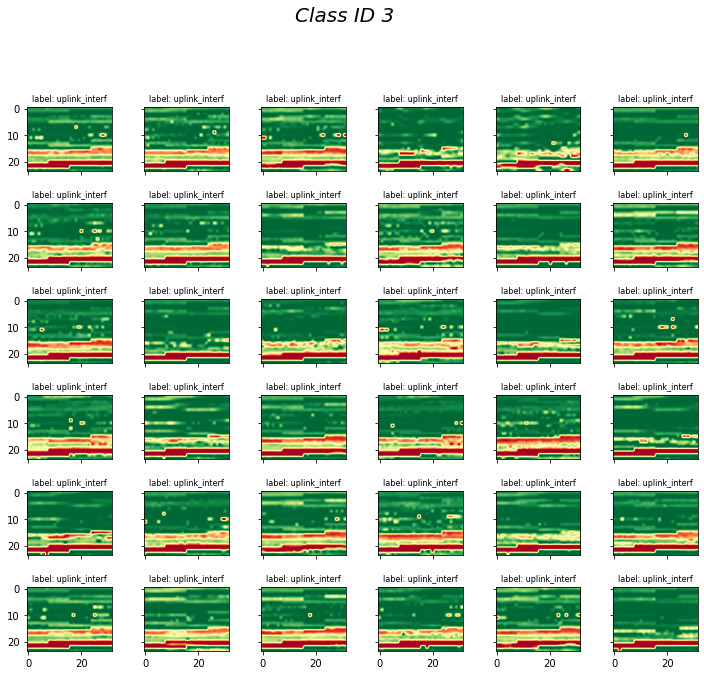

total samples: 36 / 857


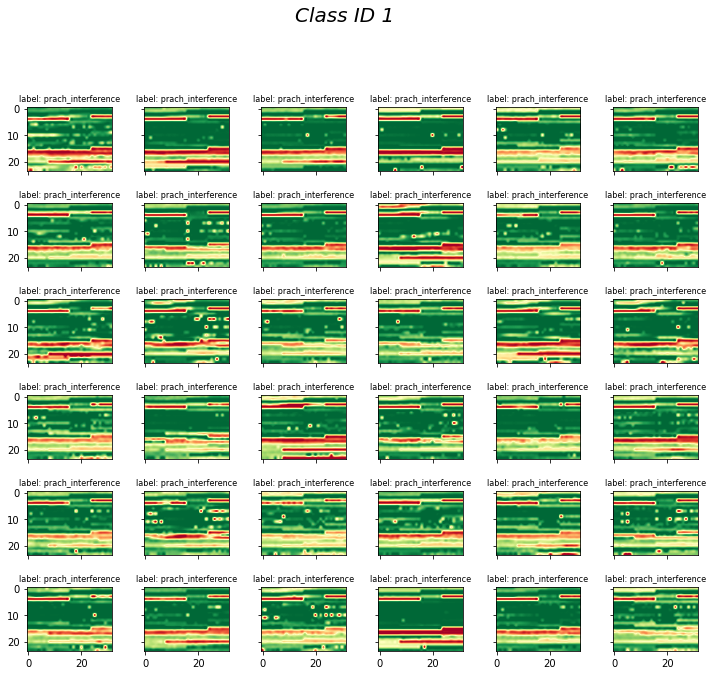

total samples: 36 / 857


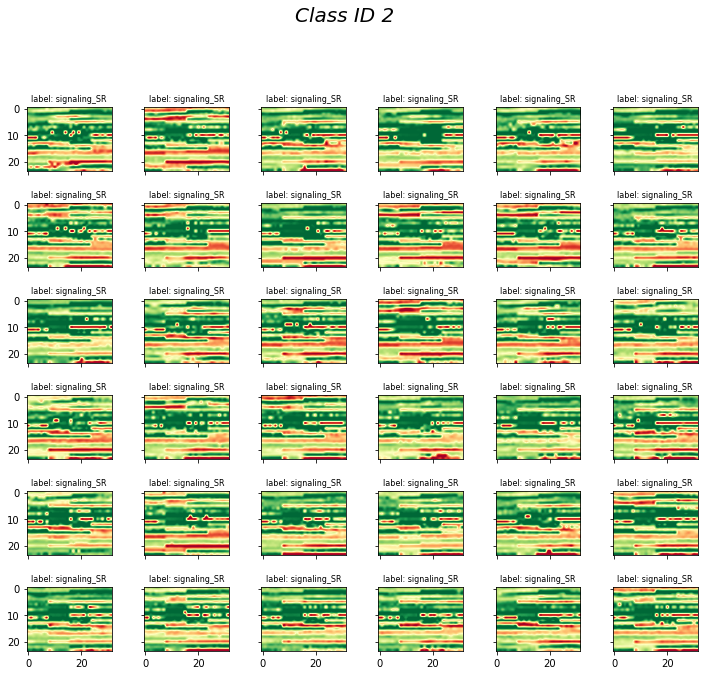

total samples: 36 / 581


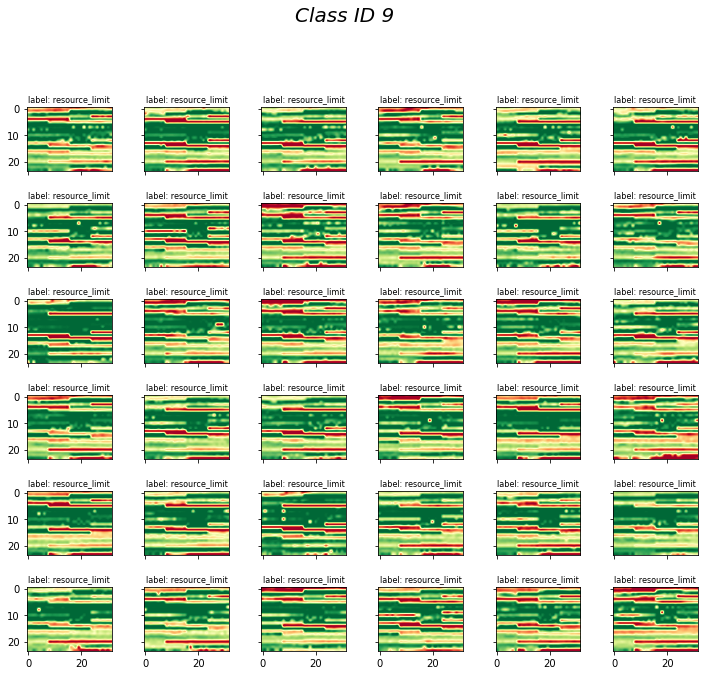

total samples: 36 / 278


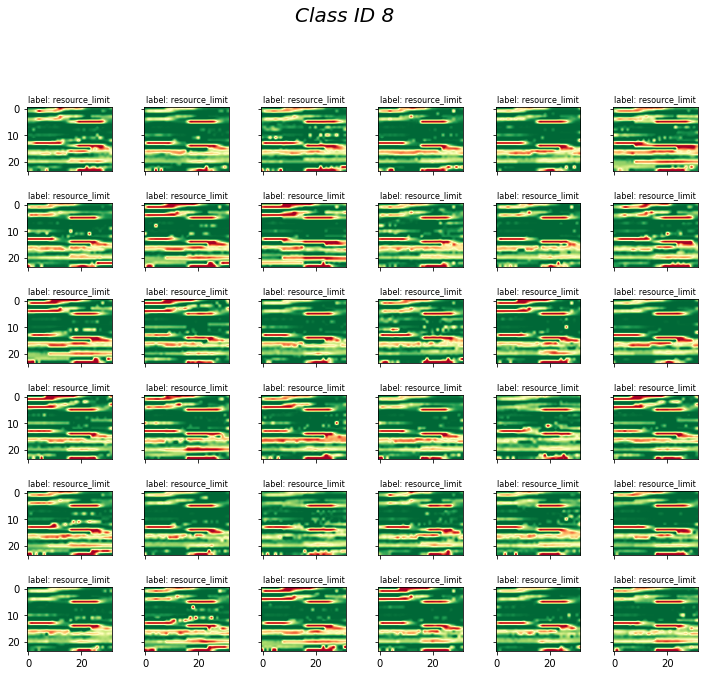

total samples: 18 / 18


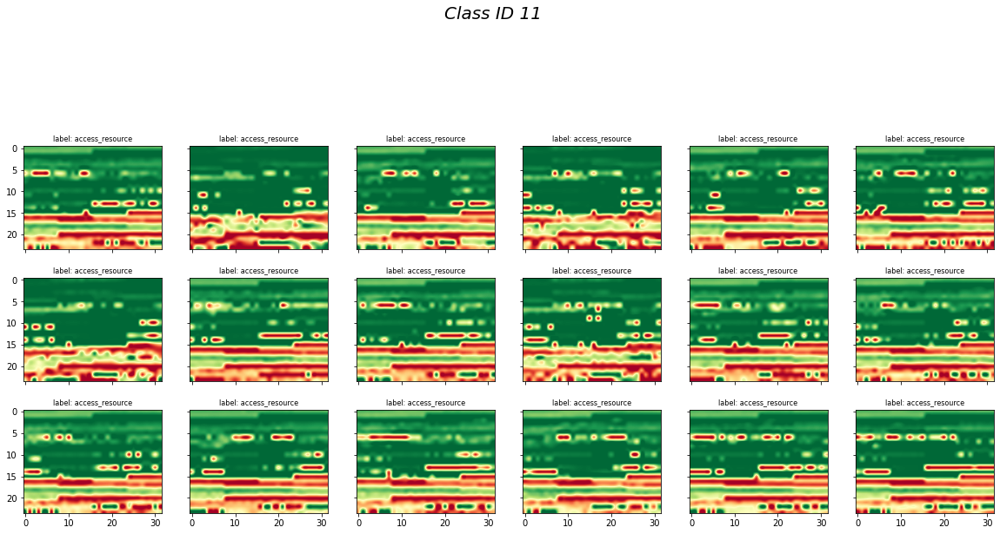

total samples: 11 / 11


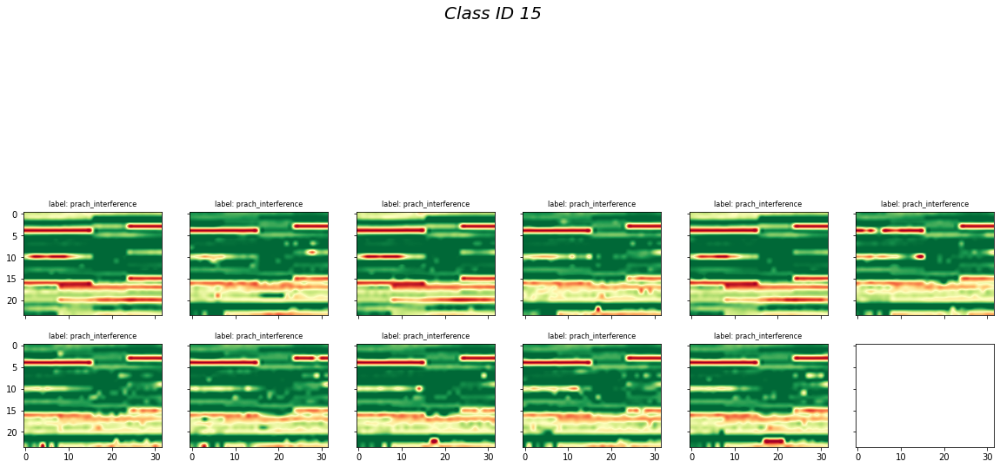

total samples: 8 / 8


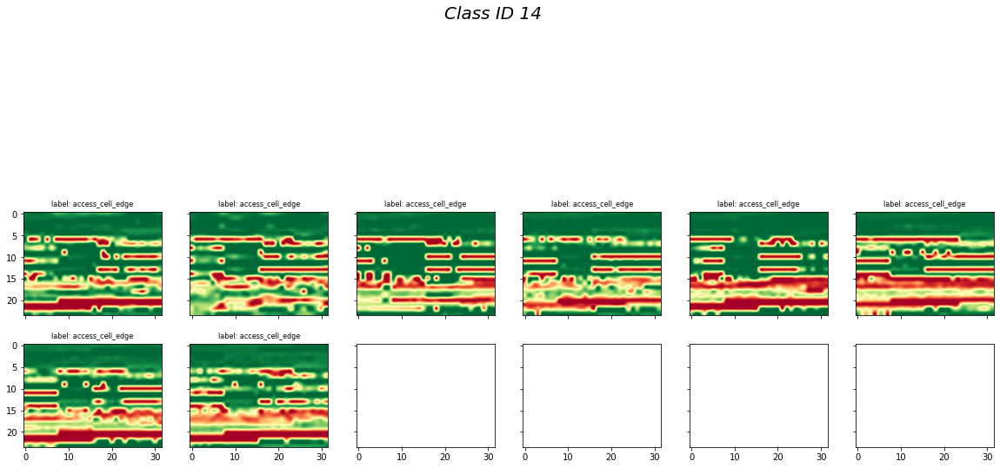

total samples: 5 / 5


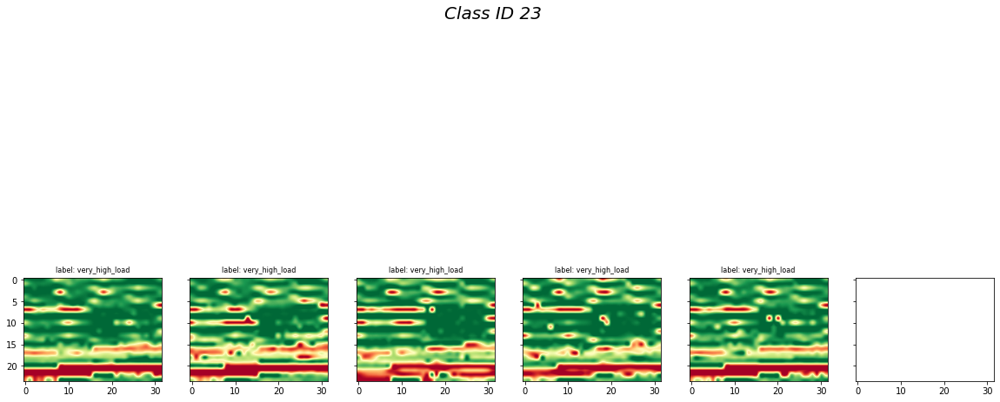

total samples: 4 / 4


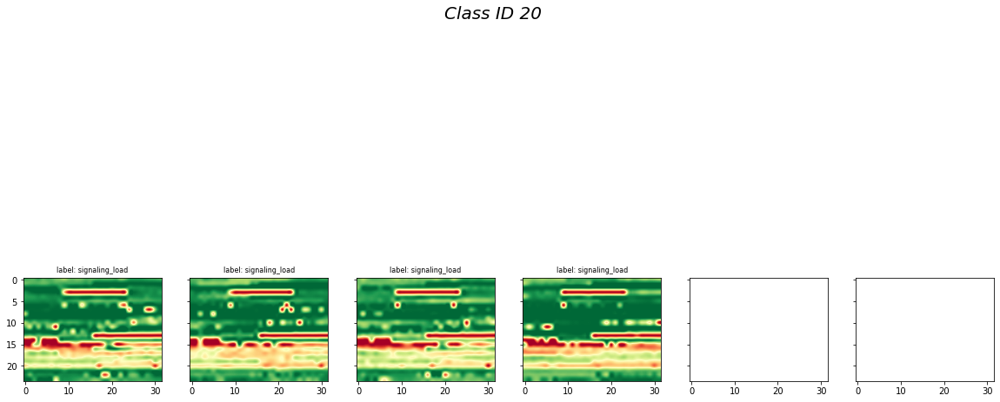

total samples: 3 / 3


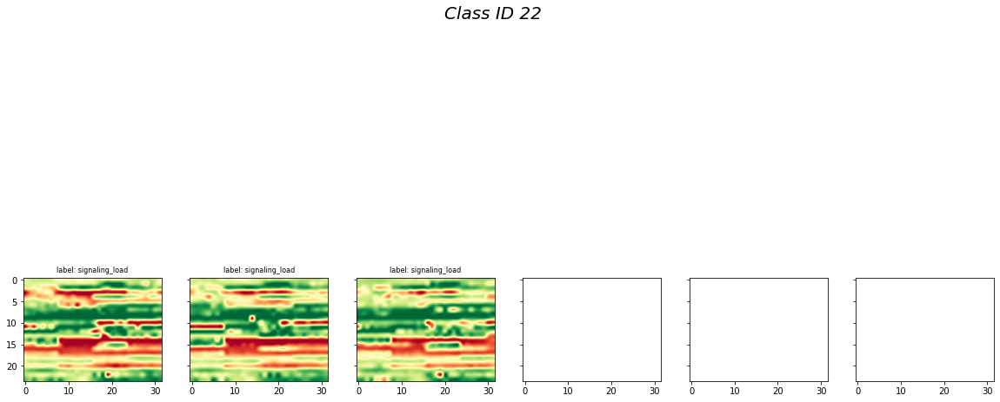

total samples: 2 / 2


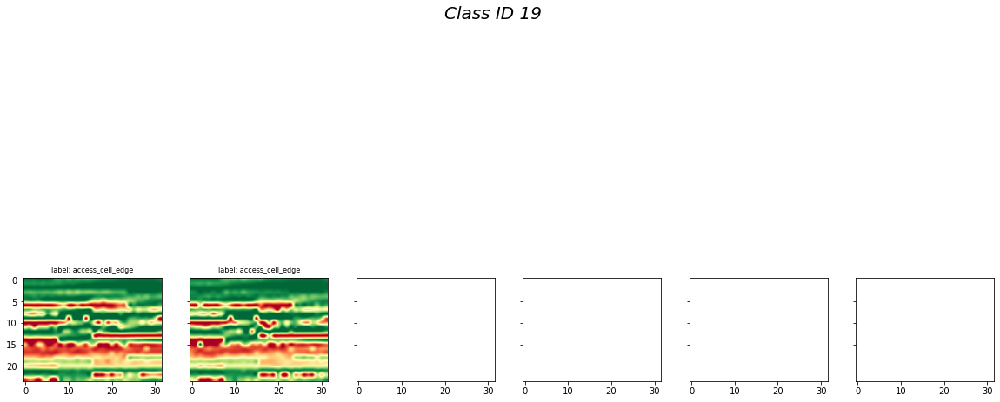

total samples: 2 / 2


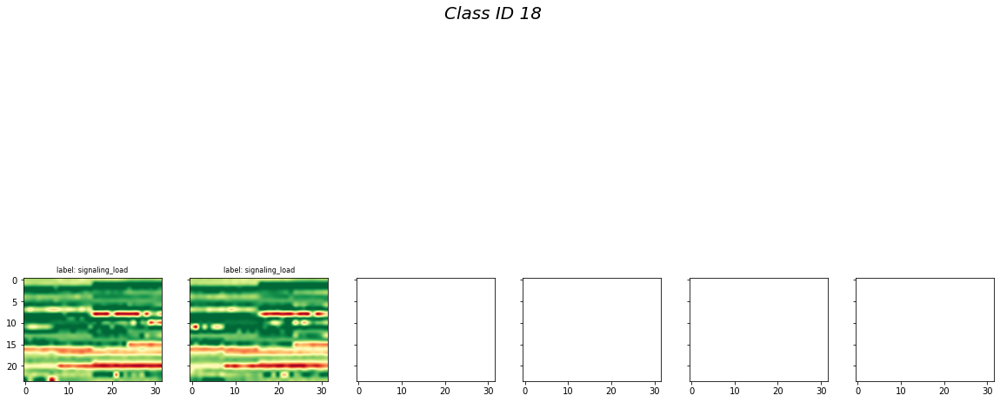

total samples: 2 / 2


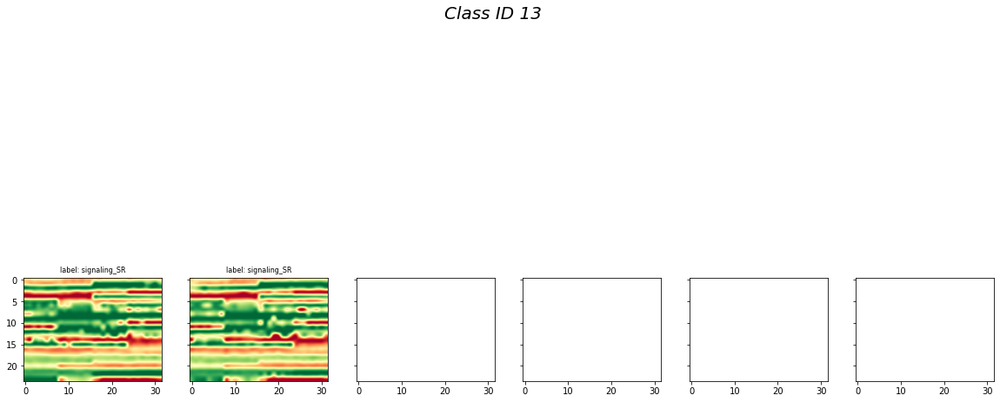

total samples: 2 / 2


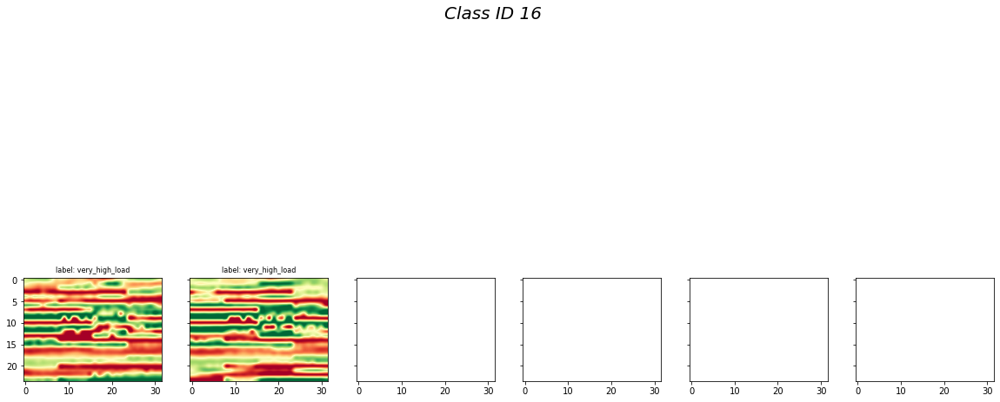

total samples: 1 / 1


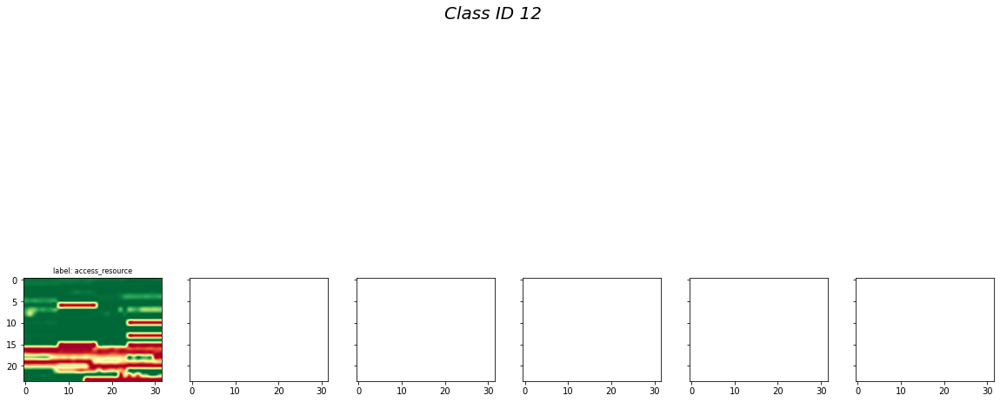

total samples: 1 / 1


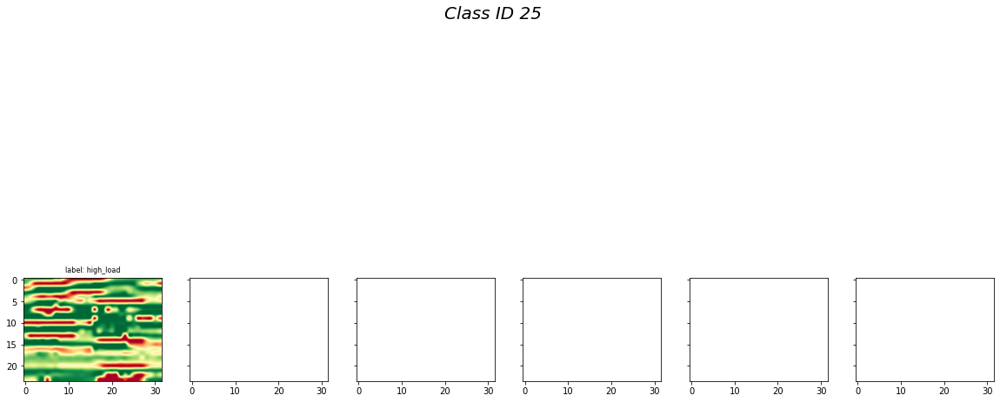

total samples: 1 / 1


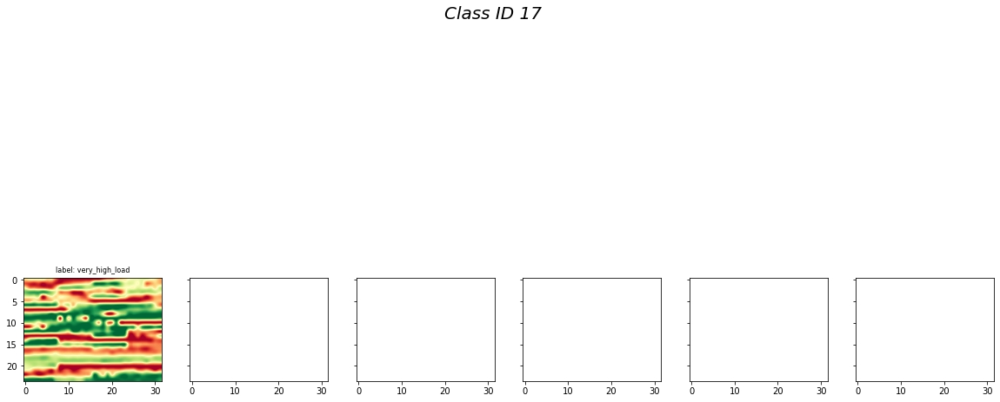

total samples: 1 / 1


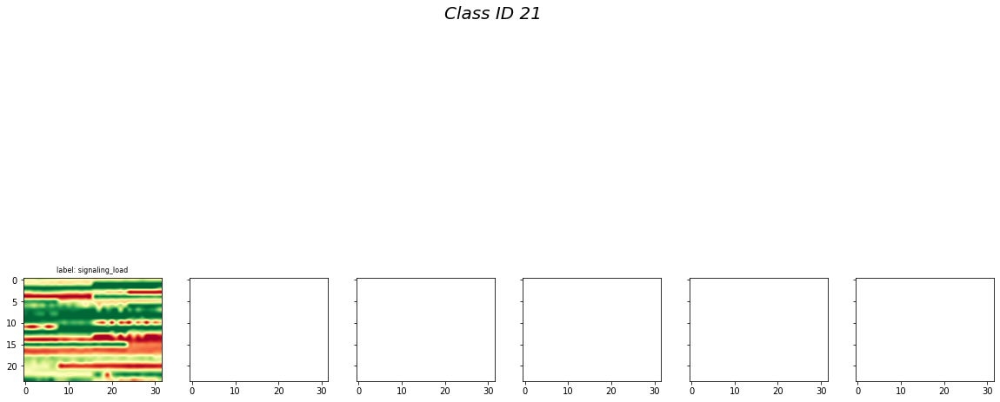

total samples: 1 / 1


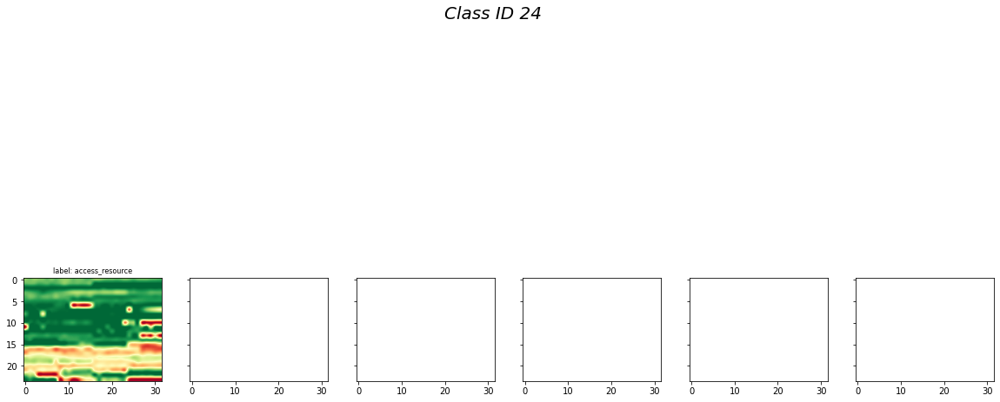

In [67]:
nrows = 10
ncols = 4
figsize = (ncols*10, nrows*3)

# default parameter values
def_vals = {'X' : None, 
            'arr_mse': None, 
            'arr_labels': None,
            'category': 'my_class', 
            'set_random': True,
            'figsize': figsize,
            'title_size': 8,
            'nrows' : nrows, 
            'ncols' :ncols,
           }
# update dictionary key value

selcted_clusters = lst_bottom_classes
# selcted_clusters = np.unique(arr_label)
for cluster_id in selcted_clusters:
    class_indx = np.where(y_pred == cluster_id)[0]
    def_vals['X'] = X_2d[class_indx]
    def_vals['arr_labels'] = y_gt[class_indx]
    def_vals['category'] = cluster_id
    dk.mgcMultiHeat(**def_vals)

# clustering analysis

## clustering accuracy

In [53]:
def clustering_accuracy(gtlabels, labels):
    from scipy.optimize import linear_sum_assignment
    cost_matrix = []
    categories = np.unique(gtlabels)
    nr = np.amax(labels) + 1
    for i in np.arange(len(categories)):
        cost_matrix.append(np.bincount(labels[gtlabels == categories[i]], minlength=nr))
    cost_matrix = np.asarray(cost_matrix).T
    row_ind, col_ind = linear_sum_assignment(np.max(cost_matrix) - cost_matrix)

    return float(cost_matrix[row_ind, col_ind].sum()) / len(gtlabels)

clustering_accuracy(gtlabels=y_gt, labels=y_pred)

0.8836873582181893

## effective clusters

In [45]:
print(y_gt.shape, y_pred.shape)

(9698,) (9698,)


In [46]:
df_res = pd.DataFrame(np.vstack((y_gt, y_pred,)).T, columns=['ytrue', 'cluster_id'])

df_res['cluster_id'] = df_res['cluster_id'].astype(int)

In [47]:
vc_by_gt = df_res['ytrue'].value_counts()

vc_by_cluster = df_res['cluster_id'].value_counts()

In [48]:
vc_by_gt

access_cell_edge      930
ho_SR                 923
no_issue              913
normal                899
high_load             880
uplink_interf         876
prach_interference    868
resource_limit        859
signaling_SR          859
signaling_load        852
access_resource       747
very_high_load         92
Name: ytrue, dtype: int64

In [49]:
vc_by_cluster

5     1653
6      923
0      920
10     913
7      899
4      879
3      876
1      857
2      857
9      581
8      278
11      18
15      11
14       8
23       5
20       4
22       3
19       2
18       2
13       2
16       2
12       1
25       1
17       1
21       1
24       1
Name: cluster_id, dtype: int64

In [50]:
effective_clusters = vc_by_cluster[vc_by_cluster>100].index.tolist()

In [51]:
effective_clusters

[5, 6, 0, 10, 7, 4, 3, 1, 2, 9, 8]

In [52]:
len(df_res.query("cluster_id in @effective_clusters")) / len(df_res)

0.9936069292637657

## distribution analysis

In [115]:
df_cluster_pct = df_res.groupby(['cluster_id'])['ytrue'].apply(lambda x: x.value_counts() / len(x)).to_frame('ypred_pct')

df_cluster_count = df_res.groupby(['cluster_id'])['ytrue'].apply(lambda x: x.value_counts()).to_frame(name='ypred_count')

df_cluster_dist = df_cluster_count.merge(df_cluster_pct, how='inner', left_index=True, right_index=True)

df_cluster_dist = df_cluster_dist.reset_index().rename(columns={'level_1': 'class1'})

df_ytrue_counts = pd.DataFrame(vc_by_gt).reset_index().rename(columns={'ytrue': 'ytrue_counts', 'index': 'class1'})

df_cluster_dist = df_cluster_dist.merge(df_ytrue_counts, how='left', on=['class1'])

In [108]:
278+581

859

In [116]:
df_cluster_dist.set_index(['cluster_id', 'class1']).sort_index()

ypred_count  ypred_pct  ytrue_counts
cluster_id class1                                                  
0          access_cell_edge            920   1.000000           930
1          prach_interference          857   1.000000           868
2          signaling_SR                857   1.000000           859
3          uplink_interf               876   1.000000           876
4          high_load                   879   1.000000           880
5          access_resource             727   0.439806           747
           signaling_load              842   0.509377           852
           very_high_load               84   0.050817            92
6          ho_SR                       923   1.000000           923
7          normal                      899   1.000000           899
8          resource_limit              278   1.000000           859
9          resource_limit              581   1.000000           859
10         no_issue                    913   1.000000           913
11         access_resource              18   1.000000           747
12         access_resource               1   1.000000           747
13         signaling_SR                  2   1.000000           859
14         access_cell_edge              8   1.000000           930
15         prach_interference           11   1.000000           868
16         very_high_load                2   1.000000            92
17         very_high_load                1   1.000000            92
18         signaling_load                2   1.000000           852
19         access_cell_edge              2   1.000000           930
20         signaling_load                4   1.000000           852
21         signaling_load                1   1.000000           852
22         signaling_load                3   1.000000           852
23         very_high_load                5   1.000000            92
24         access_resource               1   1.000000           747
25         high_load                     1   1.000000           880

In [ ]:
np.where((y_pred==5) & (y_gt=='signaling_load'))

In [68]:
lst_top_classes

[5, 6, 0, 10, 7, 4, 3, 1, 2, 9]

### resource_limit

total samples: 40 / 278


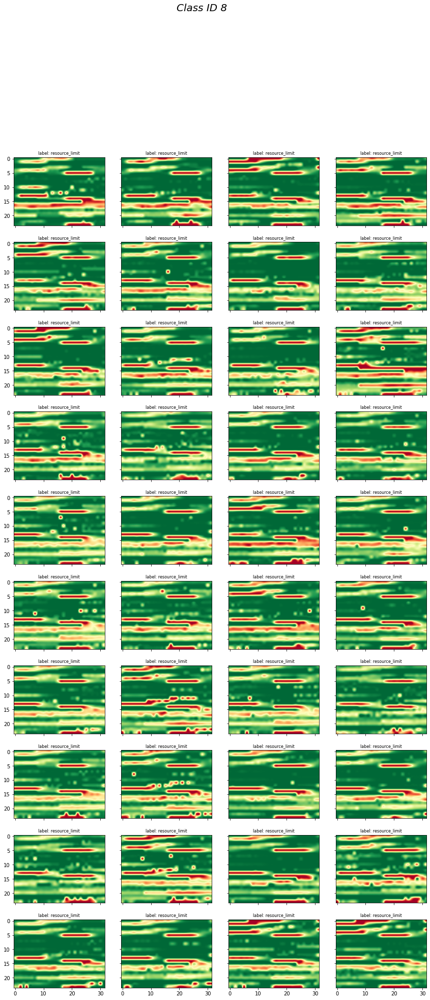

total samples: 40 / 581


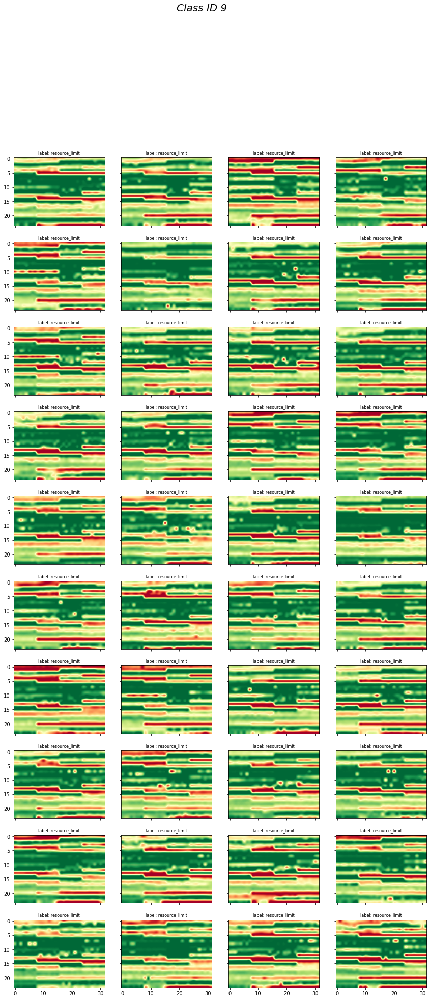

In [110]:
nrows = 10
ncols = 4
figsize = (ncols*10, nrows*3)

# default parameter values
def_vals = {'X' : None, 
            'arr_mse': None, 
            'arr_labels': None,
            'category': 'my_class', 
            'set_random': True,
            'figsize': figsize,
            'title_size': 8,
            'nrows' : nrows, 
            'ncols' :ncols,
           }
# update dictionary key value

selcted_clusters = [8, 9]
# selcted_clusters = np.unique(arr_label)
for cluster_id in selcted_clusters:
    class_indx = np.where(y_pred == cluster_id)[0]
    def_vals['X'] = X_2d[class_indx]
    def_vals['arr_labels'] = y_gt[class_indx]
    def_vals['category'] = cluster_id
    dk.mgcMultiHeat(**def_vals)

### access_resource

total samples: 40 / 727


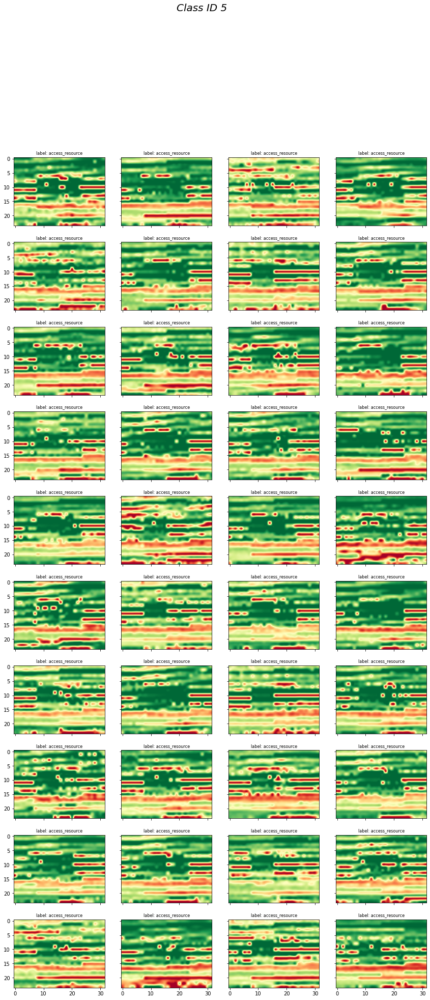

total samples: 18 / 18


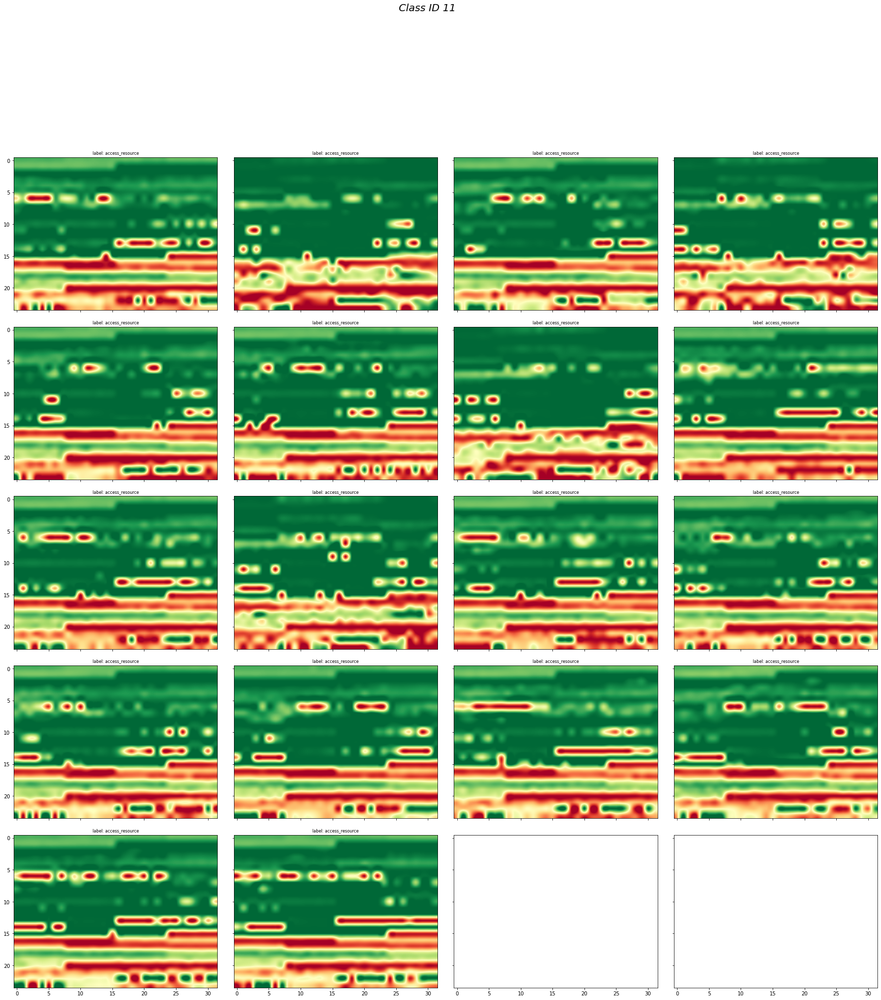

total samples: 1 / 1


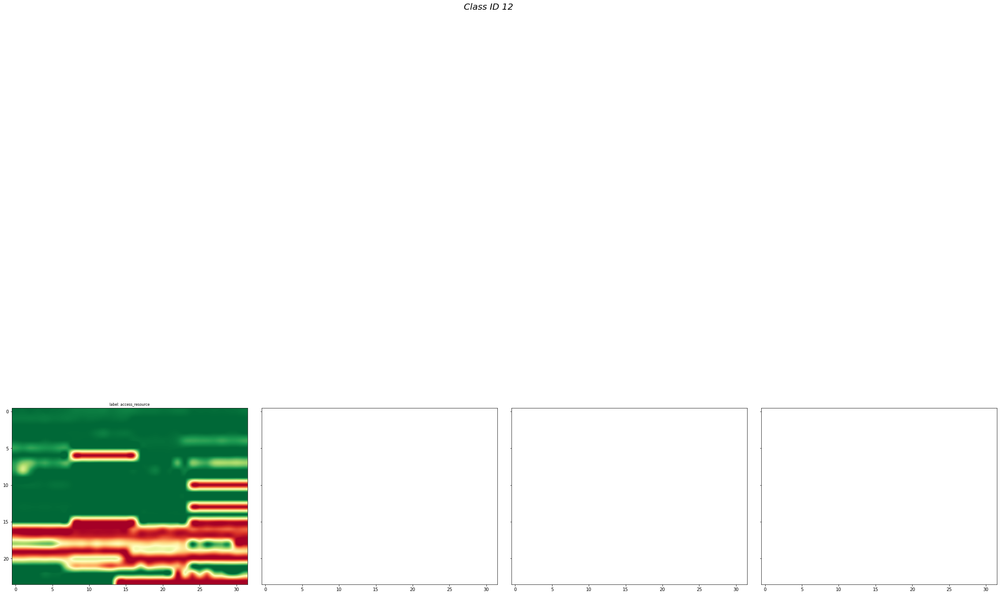

In [112]:
nrows = 10
ncols = 4
figsize = (ncols*10, nrows*3)

# default parameter values
def_vals = {'X' : None, 
            'arr_mse': None, 
            'arr_labels': None,
            'category': 'my_class', 
            'set_random': True,
            'figsize': figsize,
            'title_size': 8,
            'nrows' : nrows, 
            'ncols' :ncols,
           }
# update dictionary key value

selcted_clusters = [5, 11, 12]
# selcted_clusters = np.unique(arr_label)
for cluster_id in selcted_clusters:
    class_indx = np.where((y_pred == cluster_id) & (y_gt == 'access_resource'))[0]
    def_vals['X'] = X_2d[class_indx]
    def_vals['arr_labels'] = y_gt[class_indx]
    def_vals['category'] = cluster_id
    dk.mgcMultiHeat(**def_vals)

### mixed cluster: 5

total samples: 20 / 727


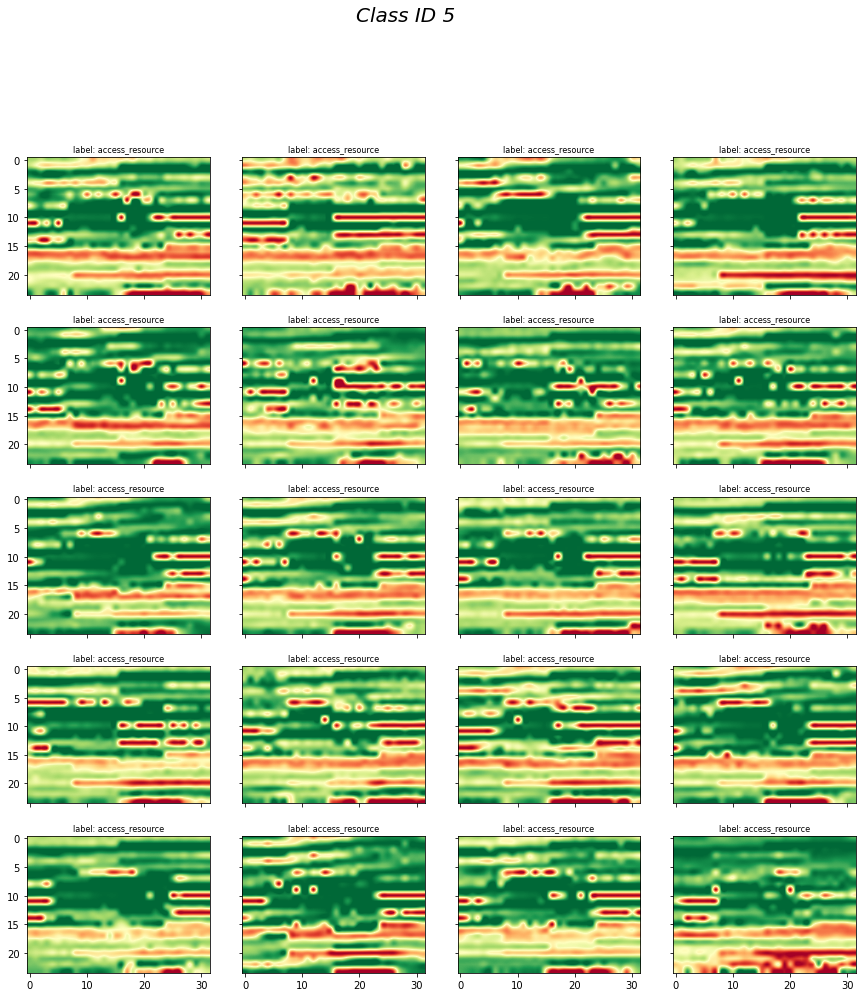

total samples: 20 / 842


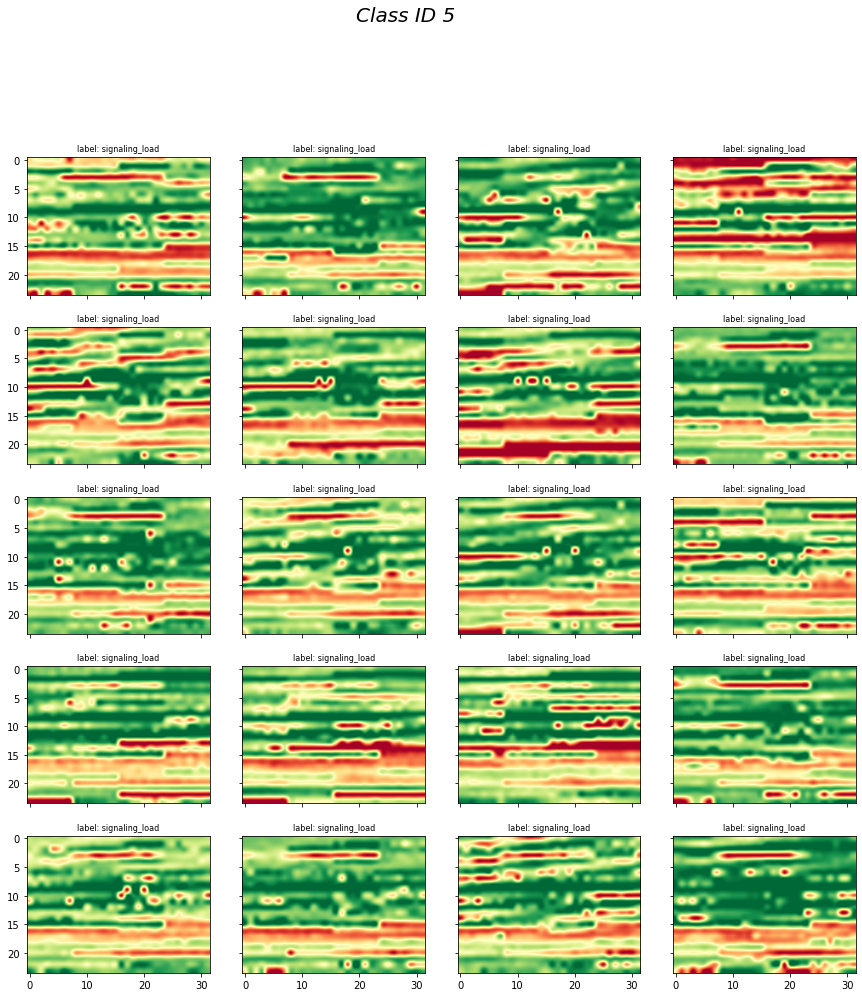

total samples: 20 / 84


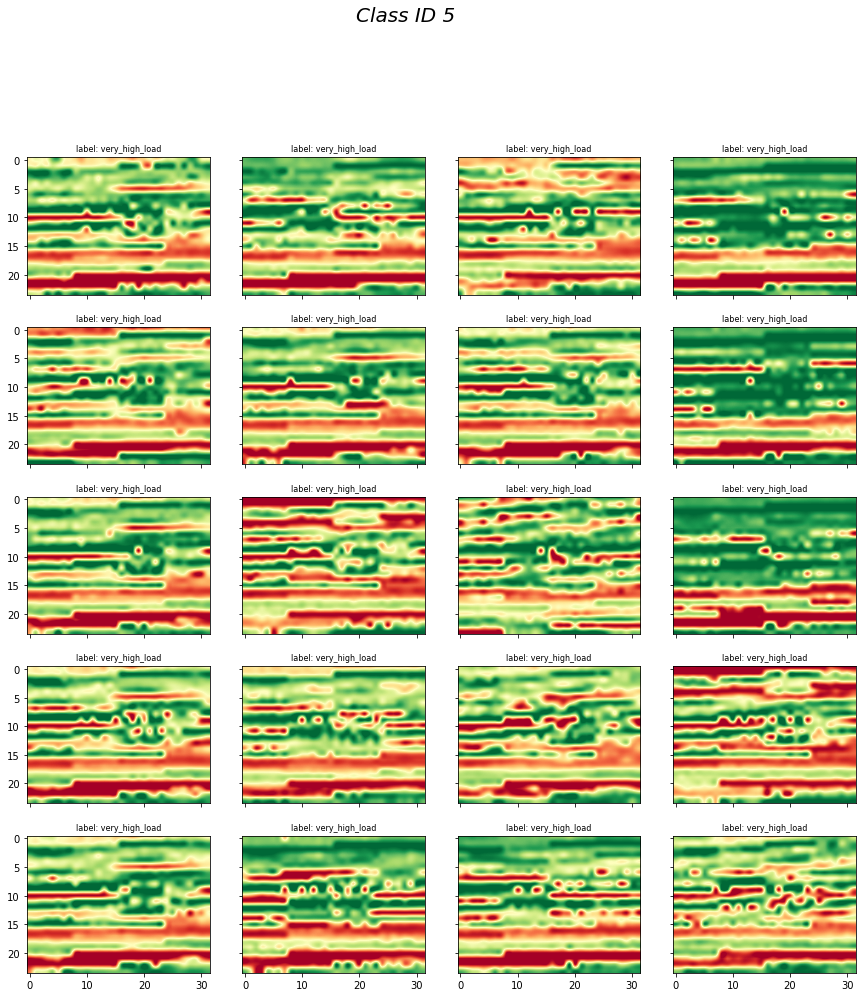

In [114]:
nrows = 5
ncols = 4
figsize = (ncols*10, nrows*3)

# default parameter values
def_vals = {'X' : None, 
            'arr_mse': None, 
            'arr_labels': None,
            'category': 'my_class', 
            'set_random': False,
            'figsize': figsize,
            'title_size': 8,
            'nrows' : nrows, 
            'ncols' :ncols,
           }
# update dictionary key value

selcted_clusters = [5]
selected_ytrue = ['access_resource', 'signaling_load', 'very_high_load']

# selcted_clusters = np.unique(arr_label)
for cluster_id in selcted_clusters:
    for ytrue_ in selected_ytrue:
        class_indx = np.where((y_pred == cluster_id) & (y_gt == ytrue_))[0]
        def_vals['X'] = X_2d[class_indx]
        def_vals['arr_labels'] = y_gt[class_indx]
        def_vals['category'] = cluster_id
        dk.mgcMultiHeat(**def_vals)